In [2]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.datasets import make_blobs
from sklearn import preprocessing
import pandas as pd
import numpy as np
from itertools import combinations

## Example for K-Means

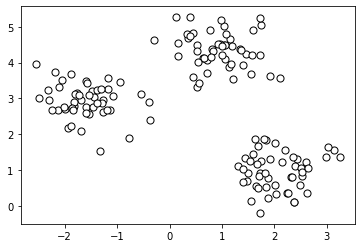

In [2]:
# source: https://towardsdatascience.com/k-means-clustering-with-scikit-learn-6b47a369a83c

# create dataset
X, y = make_blobs(
   n_samples=150, n_features=2,
   centers=3, cluster_std=0.5,
   shuffle=True, random_state=0
)

# plot
plt.scatter(
   X[:, 0], X[:, 1],
   c='white', marker='o',
   edgecolor='black', s=50
)
plt.show()

In [4]:
km = KMeans(
    n_clusters=3, init='random',
    n_init=10, max_iter=300, 
    tol=1e-04, random_state=0
)
y_km = km.fit_predict(X)

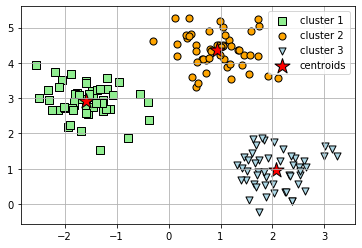

In [5]:
# plot the 3 clusters
plt.scatter(
    X[y_km == 0, 0], X[y_km == 0, 1],
    s=50, c='lightgreen',
    marker='s', edgecolor='black',
    label='cluster 1'
)

plt.scatter(
    X[y_km == 1, 0], X[y_km == 1, 1],
    s=50, c='orange',
    marker='o', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    X[y_km == 2, 0], X[y_km == 2, 1],
    s=50, c='lightblue',
    marker='v', edgecolor='black',
    label='cluster 3'
)

# plot the centroids
plt.scatter(
    km.cluster_centers_[:, 0], km.cluster_centers_[:, 1],
    s=250, marker='*',
    c='red', edgecolor='black',
    label='centroids'
)
plt.legend(scatterpoints=1)
plt.grid()
plt.show()

## Song K-Means

### Data Exploration

In [123]:
# grab data

file = 'data/wasabi_spotify_genius_reduced.csv'
rows=500

song_lbls = ['title', 'artist', 'albumTitle', 'urlSpotify']
other_lbls = ['feature_acousticness', 'feature_mode', 'feature_energy', 'feature_instrumentalness', 'feature_liveness', 'feature_valence', 'feature_loudness', 'feature_speechiness', 'feature_tempo', 'feature_key', 'feature_time_signature']
emotion_lbls = ['emotion_happy','emotion_energetic', 'emotion_calm', 'emotion_sad']


song_df = pd.read_csv(file, nrows=rows, usecols=song_lbls + emotion_lbls + other_lbls)[song_lbls + emotion_lbls + other_lbls]

In [124]:
song_df[:5]

,title,artist,albumTitle,urlSpotify,emotion_happy,emotion_energetic,emotion_calm,emotion_sad,feature_acousticness,feature_mode,feature_energy,feature_instrumentalness,feature_liveness,feature_valence,feature_loudness,feature_speechiness,feature_tempo,feature_key,feature_time_signature
0,Don't Turn Around,Ace Of Base,The Sign,https://play.spotify.com/track/0AWpG6NUEaRZvS3...,True,False,False,False,0.000214,0.0,0.770,0.14300,0.0642,0.688,-7.675,0.0748,95.624,4.0,4.0
1,Young And Proud,Ace Of Base,The Sign,https://play.spotify.com/track/1w2xd4htchMkxCZ...,True,False,False,False,0.002110,0.0,0.779,0.78800,0.0922,0.965,-13.707,0.0318,120.105,7.0,4.0
2,The Sign,Ace Of Base,The Sign,https://play.spotify.com/track/3DYVWvPh3kGwPas...,True,False,False,False,0.012700,0.0,0.828,0.06830,0.0293,0.946,-6.366,0.0426,97.010,4.0,4.0
3,Wheel Of Fortune,Ace Of Base,The Sign,https://play.spotify.com/track/4eMKocVAjXXPIbS...,False,False,False,True,0.024500,0.0,0.784,0.00759,0.0822,0.854,-8.532,0.1660,91.716,0.0,4.0
4,Happy Nation,Ace Of Base,The Sign,https://play.spotify.com/track/68u2mGQen6XB1U7...,False,False,True,False,0.002070,1.0,0.619,0.00483,0.0950,0.727,-13.117,0.0538,96.050,1.0,4.0


#### Spread

In [115]:
print('Song Emotions:')
for e in emotion_lbls:
    print('\t{}:\t{}/{} = {}'.format(e, len(song_df[song_df[e] == True].index), rows, len(song_df[song_df[e] == True].index)/rows))
print()

for x in other_lbls:
    print(x + "\n\tmean: " + str(np.mean(song_df[x])) + "\n\tstd : " + str(np.std(song_df[x])))
    print("\tmin : " + str(np.min(song_df[x])) + "\n\tmax : " + str(np.max(song_df[x])))
    print()

Song Emotions:
	emotion_happy:	206/1000 = 0.206
	emotion_energetic:	131/1000 = 0.131
	emotion_calm:	371/1000 = 0.371
	emotion_sad:	292/1000 = 0.292

feature_acousticness
	mean: 0.25478297581000003
	std : 0.30401631722651956
	min : 1.57e-06
	max : 0.995

feature_mode
	mean: 0.691
	std : 0.4620811617021408
	min : 0.0
	max : 1.0

feature_energy
	mean: 0.6455328899999999
	std : 0.24365691139868761
	min : 0.0054
	max : 0.996

feature_instrumentalness
	mean: 0.08666826774999999
	std : 0.2130242563349147
	min : 0.0
	max : 0.972

feature_liveness
	mean: 0.19198240000000005
	std : 0.16351888878732024
	min : 0.0167
	max : 0.986

feature_valence
	mean: 0.4936703
	std : 0.2562773389668115
	min : 0.0345
	max : 0.977

feature_loudness
	mean: -8.604003
	std : 4.024312318519899
	min : -29.08
	max : -1.4980000000000002

feature_speechiness
	mean: 0.0572367
	std : 0.05127226894833112
	min : 0.0236
	max : 0.512

feature_tempo
	mean: 123.081383
	std : 28.82791936658473
	min : 66.574
	max : 210.873

featur

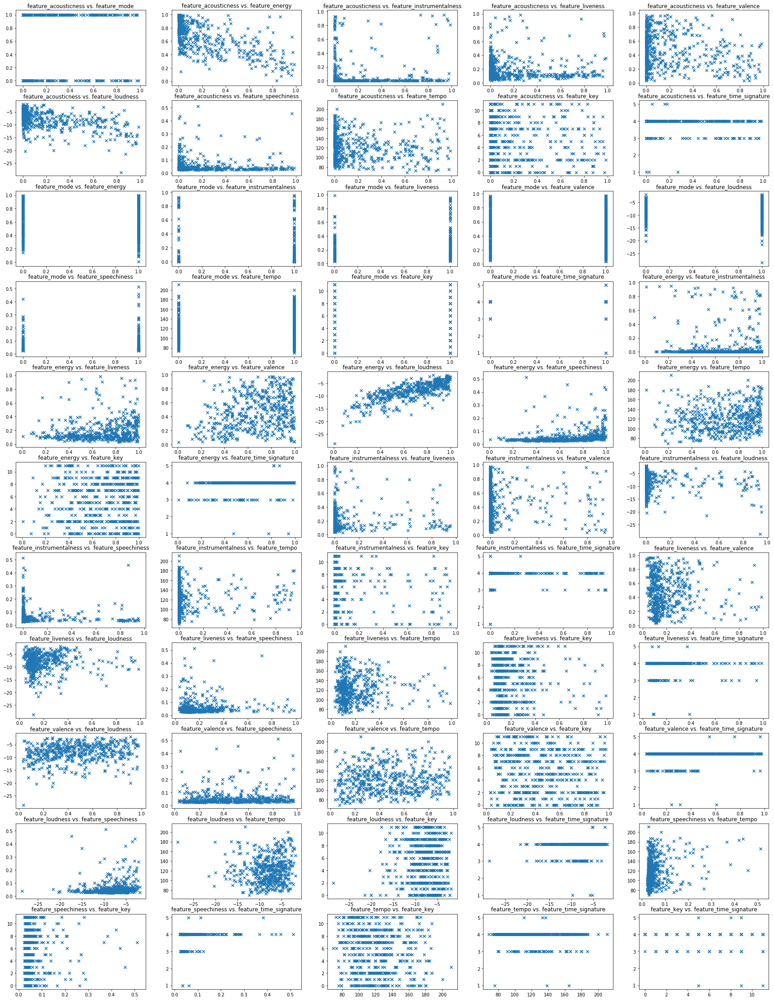

In [64]:
f, ax = plt.subplots(11,5, figsize=(30,40))
for index, i in enumerate(combinations(range(11), 2)):
    titlestr = other_lbls[i[0]] + " vs. " + other_lbls[i[1]]
#     for j in np.unique(Yr):
#         mask = np.where(Yr == j)[0]
    ax[index//5][index%5].scatter(song_df[other_lbls[i[0]]], song_df[other_lbls[i[1]]], marker="x", cmap=plt.cm.autumn)
    ax[index//5][index%5].set_title(titlestr)
    #ax[index//5][index%5].legend()

# f.show()   # showing some error and its bothering me -kai

### Cluster: 4

In [84]:
clusters = 4

km = KMeans(
    n_clusters=clusters, init='k-means++',
    n_init=10, max_iter=300, 
    tol=1e-04, random_state=0
)

song_y = km.fit_predict(song_df[other_lbls])  # prints the labels of each

In [86]:
# np.where(song_y == 0)[0]

In [87]:
# song_df.loc[rows, other_lbls[i[0]]]

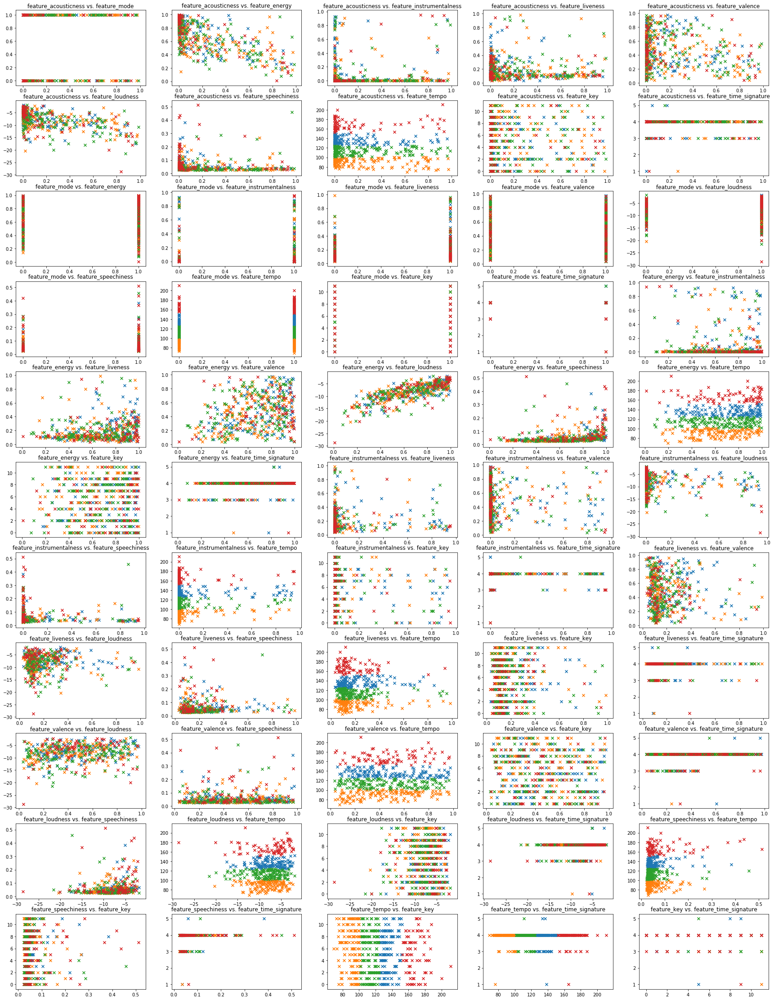

In [88]:
f, ax = plt.subplots(11,5, figsize=(30,40))
for index, i in enumerate(combinations(range(11), 2)):
    titlestr = other_lbls[i[0]] + " vs. " + other_lbls[i[1]]
    for y in range(clusters):
        rows = np.where(song_y == y)[0]
        ax[index//5][index%5].scatter(song_df.loc[rows, other_lbls[i[0]]], song_df.loc[rows, other_lbls[i[1]]], marker="x", cmap=plt.cm.autumn)
    ax[index//5][index%5].set_title(titlestr)
    #ax[index//5][index%5].legend()

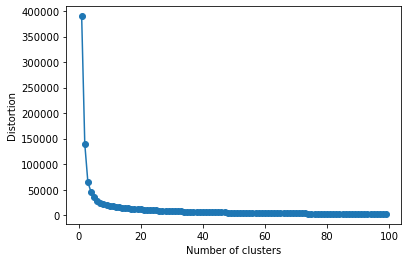

In [93]:
# calculate distortion for a range of number of cluster
max_cluster = 100
distortions = []
for i in range(1, max_cluster):
    km = KMeans(
    n_clusters=i, init='k-means++',
    n_init=10, max_iter=300, 
    tol=1e-04, random_state=0
    )
    km.fit(song_df[other_lbls])
    distortions.append(km.inertia_)

# plot
plt.plot(range(1, max_cluster), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

### Normalize/Split Categories for Data

In [120]:
'''
Categorical data that needs to be split:
    1. emotions
    2. feature_key *12 total
    3. feature_time_signature * 4 total?

Data that needs to be normalized:
    2. feature_loudness
    3. feature_tempo
    4. feature_speechiness?? Don't do this one for now

'''
np.unique(song_df['feature_time_signature'])

array([1., 3., 4., 5.])

In [125]:
# emotions to 0-1
for e in emotion_lbls:
    song_df[e] = song_df[e].astype(int)

In [135]:
# add extra rows for each feature
t = 'feature_time_signature'
k = 'feature_key'
print(np.unique(song_df[t]))
print(np.unique(song_df[k]))


time_sig = pd.get_dummies(song_df[t], prefix=t)
key = pd.get_dummies(song_df[k], prefix=k)

song_df = pd.concat([song_df, time_sig, key], axis=1)

[1. 3. 4. 5.]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]


In [137]:
# drop the columns since they are split
song_df.drop([t, k], axis=1, inplace=True)

In [168]:
features = [x for x in list(song_df.columns.values) if x not in song_lbls]

In [177]:
# normalize loudness and tempo

cols_to_norm = ['feature_loudness', 'feature_tempo']
song_df[cols_to_norm] = song_df[cols_to_norm].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

In [184]:
song_df['feature_loudness']

### Cluster: 4 Normalized

In [180]:
clusters = 4

km = KMeans(
    n_clusters=clusters, init='k-means++',
    n_init=10, max_iter=300, 
    tol=1e-04, random_state=0
)

song_y = km.fit_predict(song_df[features])  # prints the labels of each

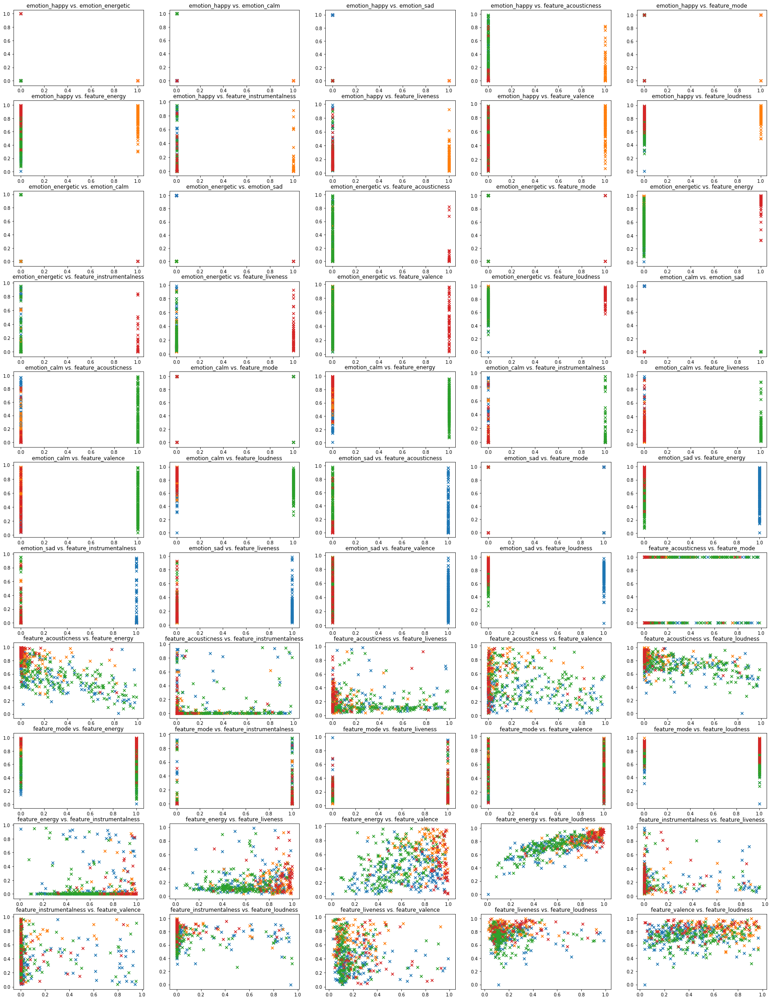

In [183]:
f, ax = plt.subplots(11,5, figsize=(30,40))
for index, i in enumerate(combinations(range(11), 2)):
    titlestr = features[i[0]] + " vs. " + features[i[1]]
    for y in range(clusters):
        rows = np.where(song_y == y)[0]
        ax[index//5][index%5].scatter(song_df.loc[rows, features[i[0]]], song_df.loc[rows, features[i[1]]], marker="x", cmap=plt.cm.autumn)
    ax[index//5][index%5].set_title(titlestr)
    #ax[index//5][index%5].legend()

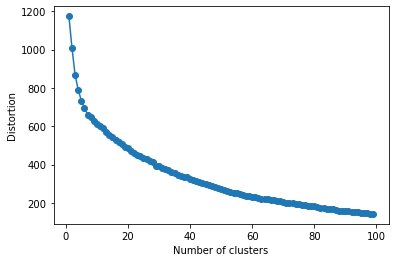

In [186]:
# calculate distortion for a range of number of cluster
max_cluster = 100
distortions = []
for i in range(1, max_cluster):
    km = KMeans(
    n_clusters=i, init='k-means++',
    n_init=10, max_iter=300, 
    tol=1e-04, random_state=0
    )
    km.fit(song_df[features])
    distortions.append(km.inertia_)

# plot
plt.plot(range(1, max_cluster), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

### Cluster: 100

In [187]:
clusters = 100  # 5 each

km = KMeans(
    n_clusters=clusters, init='k-means++',
    n_init=10, max_iter=300, 
    tol=1e-04, random_state=0
)

song_y = km.fit_predict(song_df[features])  # prints the labels of each

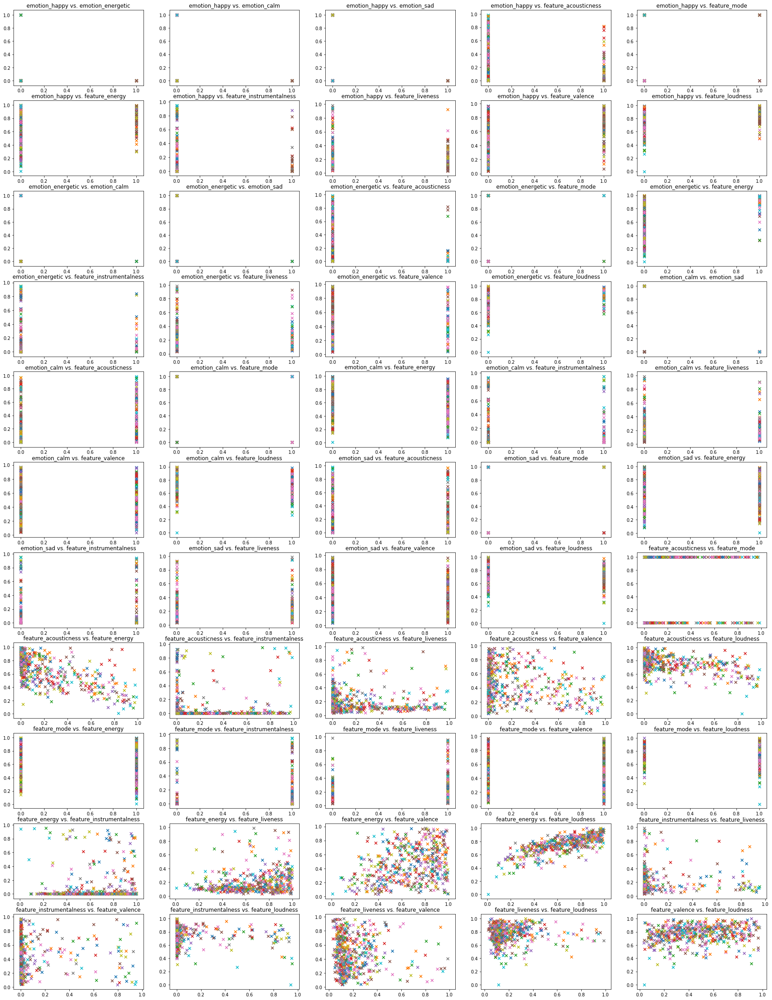

In [188]:
f, ax = plt.subplots(11,5, figsize=(30,40))
for index, i in enumerate(combinations(range(11), 2)):
    titlestr = features[i[0]] + " vs. " + features[i[1]]
    for y in range(clusters):
        rows = np.where(song_y == y)[0]
        ax[index//5][index%5].scatter(song_df.loc[rows, features[i[0]]], song_df.loc[rows, features[i[1]]], marker="x", cmap=plt.cm.autumn)
    ax[index//5][index%5].set_title(titlestr)
    #ax[index//5][index%5].legend()

In [191]:
song_y

array([85, 55, 85, 66, 82, 11, 55,  9, 33, 48, 32, 47, 84,  5,  3, 31, 19,
       80, 36, 66, 90,  4, 92, 11, 67, 39, 87, 23, 68, 20, 18, 20, 55, 80,
       11, 90, 67, 71,  6, 37, 86, 56,  0, 56, 63, 17, 55, 61, 28, 35, 23,
       25, 51, 51, 75, 23,  2, 75, 69, 17, 96, 28, 52, 15,  9, 93,  9,  6,
       54, 52, 21, 40, 45, 26, 50, 26,  8, 79, 26, 15, 45, 15, 15, 15,  0,
       27, 15, 83, 74, 98, 49, 63, 45, 19, 56, 63, 15, 77, 77, 24, 45, 56,
       49, 25, 15, 14, 15,  0, 45, 33, 15, 15, 19, 65, 78, 39, 18, 29, 58,
       30, 17, 43, 42, 78, 61,  6, 61, 60, 71, 55, 23,  4, 28, 35, 35,  8,
       93,  3,  9, 22, 23, 82, 64, 54, 83, 64, 61, 18,  4, 28, 26,  4, 22,
       98, 87, 11, 16, 16,  3, 35,  9, 20, 38, 20, 32, 65, 72, 58,  4, 54,
       55, 88, 72, 14, 20,  5, 40, 26, 81,  0,  0, 45, 66, 15, 65, 96,  2,
       66, 27, 32, 51, 22,  1, 55,  4,  4, 20, 15, 10, 93,  2,  1, 69, 57,
        7, 15, 11, 34,  5, 29, 34,  4,  1, 29,  1, 22, 64, 90, 82, 62, 24,
       18, 58,  9, 99, 96

In [224]:
c = 0 # 0, 55


print(np.where(song_y == c)[0])

for i in range(len(np.where(song_y == c)[0])):
    print(song_df.loc[np.where(song_y == c)[0][i], 'urlSpotify']) 

    
pd.set_option('display.max_columns', None)
song_df.loc[np.where(song_y == c)[0]]

[  1   6  32  46 129 170 193 346 350 383 396 397 432]
https://play.spotify.com/track/1w2xd4htchMkxCZEreKpvW
https://play.spotify.com/track/6Ny7WYH0wjS4HnlaRaqDwV
https://play.spotify.com/track/5Af1el8XZK7PyiUOoy23xg
https://play.spotify.com/track/2UaJdr9yD2S0bi9cDhIiEP
https://play.spotify.com/track/6JAzU3Vy6uxrnh2zAd0byh
https://play.spotify.com/track/60EMxLu6KT7nqA5oQkxUiJ
https://play.spotify.com/track/0CGAd36FaG6tuohxS8Lebs
https://play.spotify.com/track/7ek3WWKA2pU5CMmKazoDYf
https://play.spotify.com/track/39nvL1dzPK5Rl9Nr0qDrCS
https://play.spotify.com/track/0KoCNuEPAJbVJVhz46FOnV
https://play.spotify.com/track/7wEnYCSYzrA5KyblsBknGx
https://play.spotify.com/track/5ksIbZrgm9fVbZSgZkU1k5
https://play.spotify.com/track/2JOMIs5PhVbSKr9rYKIKkc


,title,artist,albumTitle,urlSpotify,emotion_happy,emotion_energetic,emotion_calm,emotion_sad,feature_acousticness,feature_mode,feature_energy,feature_instrumentalness,feature_liveness,feature_valence,feature_loudness,feature_speechiness,feature_tempo,feature_time_signature_1.0,feature_time_signature_3.0,feature_time_signature_4.0,feature_time_signature_5.0,feature_key_0.0,feature_key_1.0,feature_key_2.0,feature_key_3.0,feature_key_4.0,feature_key_5.0,feature_key_6.0,feature_key_7.0,feature_key_8.0,feature_key_9.0,feature_key_10.0,feature_key_11.0
1,Young And Proud,Ace Of Base,The Sign,https://play.spotify.com/track/1w2xd4htchMkxCZ...,1,0,0,0,0.00211,0.0,0.779,0.788000,0.0922,0.965,0.557267,0.0318,0.359354,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
6,Never Gonna Say I'm Sorry,Ace Of Base,The Bridge,https://play.spotify.com/track/6Ny7WYH0wjS4Hnl...,1,0,0,0,0.01740,1.0,0.832,0.602000,0.4740,0.893,0.732842,0.0403,0.210457,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
32,Dude (Looks Like A Lady),Aerosmith,Permanent Vacation,https://play.spotify.com/track/5Af1el8XZK7PyiU...,1,0,0,0,0.42200,1.0,0.985,0.000030,0.0355,0.936,0.945163,0.0434,0.403276,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
46,Because I Got High,Afroman,Because I Got High,https://play.spotify.com/track/2UaJdr9yD2S0bi9...,1,0,0,0,0.16400,1.0,0.314,0.000000,0.1580,0.842,0.709779,0.5120,0.683735,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
129,Wait Til You See My Smile,Alicia Keys,The Element Of Freedom,https://play.spotify.com/track/6JAzU3Vy6uxrnh2...,1,0,0,0,0.36400,1.0,0.506,0.039500,0.1030,0.069,0.715685,0.0269,0.358204,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
170,The Art Of Losing,American Hi-Fi,The Art Of Losing,https://play.spotify.com/track/60EMxLu6KT7nqA5...,1,0,0,0,0.00172,1.0,0.904,0.000457,0.1480,0.673,0.976189,0.0450,0.699080,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
193,Cupid,Amy Winehouse,Back To Black: B-Sides,https://play.spotify.com/track/0CGAd36FaG6tuoh...,1,0,0,0,0.21600,1.0,0.602,0.000001,0.1000,0.716,0.893242,0.0649,0.133242,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
346,Killamangiro,Babyshambles,Down In Albion,https://play.spotify.com/track/7ek3WWKA2pU5CMm...,1,0,0,0,0.03540,1.0,0.898,0.002240,0.2220,0.419,0.911222,0.0594,0.287256,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
350,Roll On Down The Highway,Bachman-Turner Overdrive,Not Fragile,https://play.spotify.com/track/39nvL1dzPK5Rl9N...,1,0,0,0,0.01280,1.0,0.964,0.160000,0.4000,0.750,0.917352,0.0426,0.503190,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
383,Robert De Niro's Waiting,Bananarama,Bananarama,https://play.spotify.com/track/0KoCNuEPAJbVJVh...,1,0,0,0,0.18200,1.0,0.753,0.000362,0.2990,0.923,0.750224,0.0262,0.430704,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0


In [ ]:
A = tf-idf cosine grabs songs
B = k-means clustering grabs songs

Intersection of A and B

### PCA

In [ ]:
### Run PCA on the data and reduce the dimensions in pca_num_components dimensions
reduced_data = PCA(n_components=pca_num_components).fit_transform(data)
results = pd.DataFrame(reduced_data,columns=['pca1','pca2'])

sns.scatterplot(x="pca1", y="pca2", hue=data['clusters'], data=results)
plt.title('K-means Clustering with 2 dimensions')
plt.show()

### BERT Model Clustering

In [115]:
# grab data

file = 'data/full_final_layer_lda.csv'
rows=3804

song_lbls = ['title', 'artist', 'lastfm_id', 'genius_id']
embedding_lbls = [str(i) for i in range(0, 768)]
other_lbls = ['feature_acousticness', 'feature_mode', 'feature_energy', 'feature_instrumentalness', 'feature_liveness', 'feature_valence', 'feature_loudness', 'feature_speechiness', 'feature_tempo', 'feature_key', 'feature_time_signature']
result_lbls = ['tag',] + [str(i) for i in np.arange(0.1, 7.1, 1)]

bert_df = pd.read_csv(file, nrows=rows, usecols=song_lbls + embedding_lbls + other_lbls + result_lbls)[song_lbls + embedding_lbls + other_lbls + result_lbls]

In [116]:
bert_df.head()

,title,artist,lastfm_id,genius_id,0,1,2,3,4,5,...,feature_key,feature_time_signature,tag,0.1,1.1,2.1,3.1,4.1,5.1,6.1
0,Rough Hands,Alexisonfire,TRQNBJV128F42972BF,199499.0,-0.010264,0.258167,-0.220201,0.940947,0.649560,0.350384,...,7.0,4.0,1.0,0.276055,0.293805,0.062990,0.004494,0.004485,0.353698,0.004474
1,Fallin',Alicia Keys,TRIHMLE128F92F3F8C,344010.0,-1.059281,-0.097577,-0.374088,0.208535,-0.195247,0.231946,...,10.0,4.0,1.0,0.002077,0.002076,0.002076,0.002077,0.388016,0.601600,0.002079
2,Goodbye,Alicia Keys,TRDTVQK128F4284EEC,149388.0,-1.096073,-0.149015,0.301168,-0.518656,-0.958317,-0.654276,...,5.0,4.0,1.0,0.036970,0.204947,0.001935,0.001937,0.001938,0.670241,0.082031
3,Sick And Tired,Anastacia,TRHDAOF128F4284873,808482.0,0.071496,0.251873,-0.124952,0.523993,0.440293,0.111601,...,9.0,4.0,1.0,0.005305,0.283567,0.167109,0.265695,0.005311,0.194196,0.078817
4,Hold On,Angus & Julia Stone,TRIBPYT12903CB5C29,797364.0,0.054763,0.138454,-0.386024,0.883385,0.410160,-0.110172,...,9.0,4.0,1.0,0.003694,0.003680,0.203236,0.003670,0.321403,0.003670,0.460646
5,For You,Angus & Julia Stone,TRENKFJ12903CB5C2B,524878.0,-0.513028,-0.165109,0.414600,-0.181203,-1.291213,-1.181725,...,1.0,4.0,1.0,0.001085,0.112245,0.495741,0.282882,0.032739,0.074220,0.001089
6,Walk It Off,Angus & Julia Stone,TRLSGMU12903CB5C31,796819.0,-0.050797,0.318364,-0.107133,0.726410,0.593442,0.345564,...,1.0,4.0,1.0,0.355875,0.002511,0.105236,0.096533,0.328396,0.108930,0.002520
7,Stop The Rock,Apollo 440,TRFCQMU12903CD1FA4,1083171.0,-0.123178,0.467157,-0.207555,0.545349,0.655049,0.159262,...,1.0,4.0,0.0,0.001510,0.001511,0.001515,0.001508,0.431484,0.001513,0.560958
8,Show Me The Meaning Of Being Lonely,Backstreet Boys,TRTYXZK128F4290090,328811.0,0.424804,0.203060,-0.377790,0.745852,0.123203,0.320510,...,6.0,4.0,1.0,0.071883,0.035022,0.001815,0.133966,0.228640,0.526857,0.001817
9,Vision Of You,Belinda Carlisle,TRPWPUK128F1458648,852762.0,0.132436,-0.015045,-0.174292,0.705355,0.719554,0.147957,...,2.0,4.0,1.0,0.004632,0.274106,0.409687,0.004613,0.297703,0.004639,0.004620


In [117]:
first = 11
print('Bert Embeddings')

for x in embedding_lbls[:first]:
    print(x + "\n\tmean: " + str(np.mean(bert_df[x])) + "\n\tstd : " + str(np.std(bert_df[x])))
    print("\tmin : " + str(np.min(bert_df[x])) + "\n\tmax : " + str(np.max(bert_df[x])))
    print()

Bert Embeddings
0
	mean: -0.27818618754165064
	std : 0.5322220027533202
	min : -1.945257
	max : 0.82527936

1
	mean: 0.18604259656580835
	std : 0.2917220182267075
	min : -0.95273143
	max : 0.9733691

2
	mean: -0.004598604295192693
	std : 0.29312855521798237
	min : -1.0276254
	max : 1.4843098999999995

3
	mean: 0.4150729403615826
	std : 0.46697899245005425
	min : -1.1165364
	max : 1.625691

4
	mean: -0.09746958550295741
	std : 0.7017882431921074
	min : -2.111021
	max : 1.1155073999999998

5
	mean: -0.15673600152637487
	std : 0.47049378884897186
	min : -1.6431985
	max : 1.0178934000000002

6
	mean: 0.26730849652309485
	std : 0.3906147408153011
	min : -1.0849666999999998
	max : 1.8594035

7
	mean: 0.1679434749394085
	std : 0.45907103213918793
	min : -1.1041286
	max : 2.0161219

8
	mean: 0.12819888558817685
	std : 0.28148537506769084
	min : -1.0803641000000002
	max : 0.9676783

9
	mean: -0.00943331965102524
	std : 0.5913742653358184
	min : -1.2573024
	max : 1.7687265

10
	mean: -0.11131730

### Normalize/Split Categories for Data

In [43]:
'''
Categorical data that needs to be split:
    1. emotions
    2. feature_key *12 total
    3. feature_time_signature * 4 total?

Data that needs to be normalized:
    ** Only embeddings for now
    
    2. feature_loudness
    3. feature_tempo
    4. feature_speechiness?? Don't do this one for now

'''
pass
# np.unique(song_df['feature_time_signature'])

In [118]:
# normalize embeddings

bert_df[embedding_lbls] = bert_df[embedding_lbls].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

In [119]:
bert_df.head()

,title,artist,lastfm_id,genius_id,0,1,2,3,4,5,...,feature_key,feature_time_signature,tag,0.1,1.1,2.1,3.1,4.1,5.1,6.1
0,Rough Hands,Alexisonfire,TRQNBJV128F42972BF,199499.0,0.698418,0.628679,0.321435,0.750296,0.855589,0.749160,...,7.0,4.0,1.0,0.276055,0.293805,0.062990,0.004494,0.004485,0.353698,0.004474
1,Fallin',Alicia Keys,TRIHMLE128F92F3F8C,344010.0,0.319785,0.443982,0.260173,0.483210,0.593757,0.704652,...,10.0,4.0,1.0,0.002077,0.002076,0.002076,0.002077,0.388016,0.601600,0.002079
2,Goodbye,Alicia Keys,TRDTVQK128F4284EEC,149388.0,0.306505,0.417277,0.528992,0.218027,0.357258,0.371623,...,5.0,4.0,1.0,0.036970,0.204947,0.001935,0.001937,0.001938,0.670241,0.082031
3,Sick And Tired,Anastacia,TRHDAOF128F4284873,808482.0,0.727929,0.625411,0.359354,0.598247,0.790730,0.659428,...,9.0,4.0,1.0,0.005305,0.283567,0.167109,0.265695,0.005311,0.194196,0.078817
4,Hold On,Angus & Julia Stone,TRIBPYT12903CB5C29,797364.0,0.721889,0.566526,0.255421,0.729305,0.781391,0.576089,...,9.0,4.0,1.0,0.003694,0.003680,0.203236,0.003670,0.321403,0.003670,0.460646


In [120]:
len(bert_df)

3804

In [125]:
# emotions to 0-1
for e in emotion_lbls:
    song_df[e] = song_df[e].astype(int)

In [135]:
# add extra rows for each feature
t = 'feature_time_signature'
k = 'feature_key'
print(np.unique(song_df[t]))
print(np.unique(song_df[k]))


time_sig = pd.get_dummies(song_df[t], prefix=t)
key = pd.get_dummies(song_df[k], prefix=k)

song_df = pd.concat([song_df, time_sig, key], axis=1)

[1. 3. 4. 5.]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]


In [137]:
# drop the columns since they are split
song_df.drop([t, k], axis=1, inplace=True)

In [168]:
features = [x for x in list(song_df.columns.values) if x not in song_lbls]

### Clustering

In [124]:
clusters = 100

km = KMeans(
    n_clusters=clusters, init='k-means++',
    n_init=10, max_iter=300, 
    tol=1e-04, random_state=0
)

song_y = km.fit_predict(bert_df[embedding_lbls])  # prints the labels of each

In [125]:
song_y

array([ 3, 53, 90, ..., 31, 83,  3])

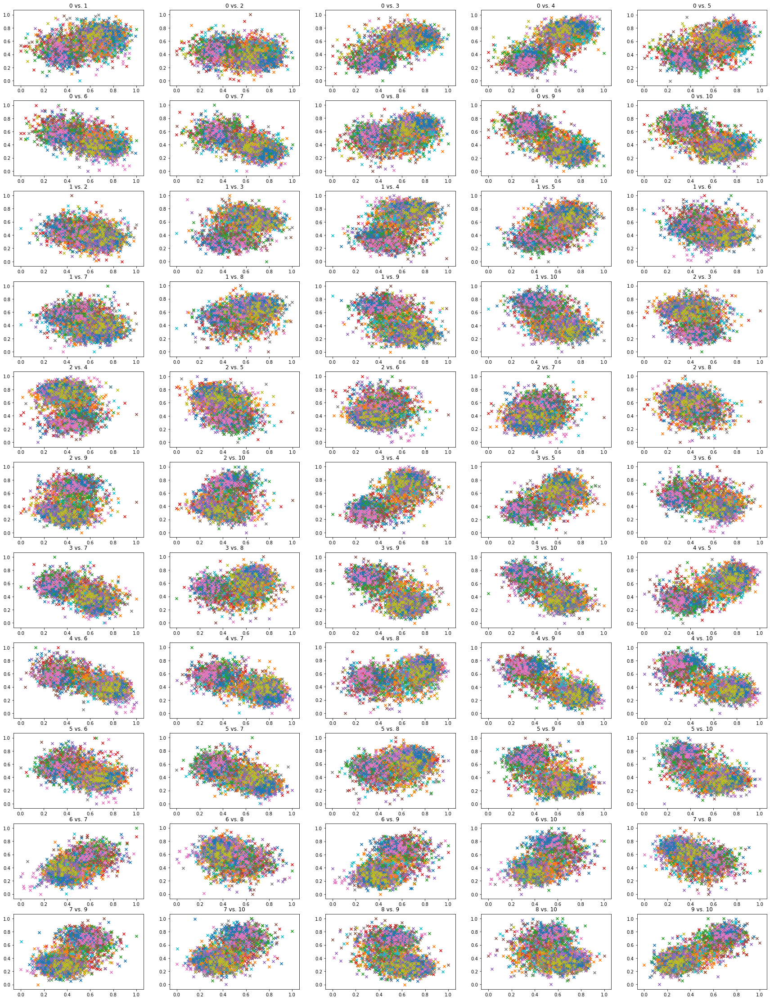

In [126]:
f, ax = plt.subplots(11,5, figsize=(30,40))
for index, i in enumerate(combinations(range(11), 2)):
    titlestr = embedding_lbls[i[0]] + " vs. " + embedding_lbls[i[1]]
    for y in range(clusters):
        rows = np.where(song_y == y)[0]
        ax[index//5][index%5].scatter(bert_df.loc[rows, embedding_lbls[i[0]]], bert_df.loc[rows, embedding_lbls[i[1]]], marker="x", cmap=plt.cm.autumn)
    ax[index//5][index%5].set_title(titlestr)
    #ax[index//5][index%5].legend()

### DBSCAN

#### Example

[ 0  1  0  2  0  1  1  2  0  0  1  1  1  2  1  0 -1  1  1  2  2  2  2  2
  1  1  2  0  0  2  0  1  1  0  1  0  2  0  0  2  2  1  1  1  1  1  0  2
  0  1  2  2  1  1  2  2  1  0  2  1  2  2  2  2  2  0  2  2  0  0  0  2
  0  0  2  1 -1  1  0  2  1  1  0  0  0  0  1  2  1  2  2  0  1  0  1 -1
  1  1  0  0  2  1  2  0  2  2  2  2 -1  0 -1  1  1  1  1  0  0  1  0  1
  2  1  0  0  1  2  1  0  0  2  0  2  2  2  0 -1  2  2  0  1  0  2  0  0
  2  2 -1  2  1 -1  2  1  1  2  2  2  0  1  0  1  0  1  0  2  2 -1  1  2
  2  1  0  1  2  2  2  1  1  2  2  0  1  2  0  0  2  0  0  1  0  1  0  1
  1  2  2  0  0  1  1  2  1  2  2  2  2  0  2  0  2  2  0  2  2  2  0  0
  1  1  1  2  2  2  2  1  2  2  0  0  2  0  0  0  1  0  1  1  1  2  1  1
  0  1  2  2  1  2  2  1  0  0  1  1  1  0  1  0  2  0  2  2  2  2  2  1
  1  0  0  1  1  0  0  2  1 -1  2  1  1  2  1  2  0  2  2  0  1  2  2  0
  2  2  0  0  2  0  2  0  2  1  0  0  0  1  2  1  2  2  0  2  2  0  0  2
  1  1  1  1  1  0  1  1  1  1  0  0  1  1  1  0  2

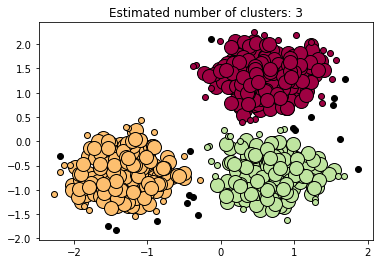

In [127]:
import numpy as np

from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler


# #############################################################################
# Generate sample data
centers = [[1, 1], [-1, -1], [1, -1]]
X, labels_true = make_blobs(n_samples=750, centers=centers, cluster_std=0.4,
                            random_state=0)

X = StandardScaler().fit_transform(X)

# #############################################################################
# Compute DBSCAN
db = DBSCAN(eps=0.3, min_samples=10).fit(X)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
print(labels)

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels_true, labels))
print("Completeness: %0.3f" % metrics.completeness_score(labels_true, labels))
print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(labels_true, labels))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(labels_true, labels))
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, labels))

# #############################################################################
# Plot result
import matplotlib.pyplot as plt

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

In [50]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler

#### Example

In [148]:

for i in [3.65, 3.7, 3.75, 3.8]:
    # Compute DBSCAN
    db = DBSCAN(eps=i, min_samples=10).fit(bert_df[embedding_lbls])
    labels = db.labels_

    # Number of clusters in labels, ignoring noise if present.
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)

    print('epsilon:', i)
    print('Cluster shape:', len(labels))
    print('Estimated number of clusters: %d' % n_clusters_)
    unique, counts = np.unique(labels, return_counts=True)
    for i in range(len(unique)):
        if unique[i] == -1:
            print('\t Cluster NOISE count: {}'.format(counts[i]))
        else:
            print('\t Cluster {} count: {}'.format(unique[i], counts[i]))

    print('Estimated number of noise points: %d' % n_noise_)
    # print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels_true, labels))
    # print("Completeness: %0.3f" % metrics.completeness_score(labels_true, labels))
    # print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
    # print("Adjusted Rand Index: %0.3f"
    #       % metrics.adjusted_rand_score(labels_true, labels))
    # print("Adjusted Mutual Information: %0.3f"
    #       % metrics.adjusted_mutual_info_score(labels_true, labels))
    try:
        print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(bert_df[embedding_lbls[:5]], labels))
    except:
        print("Silhouette Coefficient: Not valid.")
    print('\n\n')

epsilon: 3.5
Cluster shape: 3804
Estimated number of clusters: 2
	 Cluster NOISE count: 597
	 Cluster 0 count: 2382
	 Cluster 1 count: 825
Estimated number of noise points: 597
Silhouette Coefficient: 0.394



epsilon: 3.6
Cluster shape: 3804
Estimated number of clusters: 2
	 Cluster NOISE count: 514
	 Cluster 0 count: 2431
	 Cluster 1 count: 859
Estimated number of noise points: 514
Silhouette Coefficient: 0.406



epsilon: 3.7
Cluster shape: 3804
Estimated number of clusters: 2
	 Cluster NOISE count: 448
	 Cluster 0 count: 2469
	 Cluster 1 count: 887
Estimated number of noise points: 448
Silhouette Coefficient: 0.413



epsilon: 3.8
Cluster shape: 3804
Estimated number of clusters: 1
	 Cluster NOISE count: 391
	 Cluster 0 count: 3413
Estimated number of noise points: 391
Silhouette Coefficient: 0.165



epsilon: 3.9
Cluster shape: 3804
Estimated number of clusters: 1
	 Cluster NOISE count: 332
	 Cluster 0 count: 3472
Estimated number of noise points: 332
Silhouette Coefficient: 0.166

In [ ]:





'''
min_samples=10

epsilon: 3.6
Cluster shape: 3804
Estimated number of clusters: 2
	 Cluster NOISE count: 514
	 Cluster 0 count: 2431
	 Cluster 1 count: 859
Estimated number of noise points: 514
Silhouette Coefficient: 0.406



epsilon: 3.7
Cluster shape: 3804
Estimated number of clusters: 2
	 Cluster NOISE count: 448
	 Cluster 0 count: 2469
	 Cluster 1 count: 887
Estimated number of noise points: 448
Silhouette Coefficient: 0.413
'''




'''
min_samples=2

epsilon: 0.01
Cluster shape: 3804
Estimated number of clusters: 0
	 Cluster -1 count: 3804
Estimated number of noise points: 3804
Silhouette Coefficient: Not valid.



epsilon: 0.5
Cluster shape: 3804
Estimated number of clusters: 1
	 Cluster -1 count: 3802
	 Cluster 0 count: 2
Estimated number of noise points: 3802
Silhouette Coefficient: -0.220



epsilon: 1.0
Cluster shape: 3804
Estimated number of clusters: 14
	 Cluster -1 count: 3775
	 Cluster 0 count: 2
	 Cluster 1 count: 2
	 Cluster 2 count: 2
	 Cluster 3 count: 2
	 Cluster 4 count: 2
	 Cluster 5 count: 3
	 Cluster 6 count: 2
	 Cluster 7 count: 2
	 Cluster 8 count: 2
	 Cluster 9 count: 2
	 Cluster 10 count: 2
	 Cluster 11 count: 2
	 Cluster 12 count: 2
	 Cluster 13 count: 2
Estimated number of noise points: 3775
Silhouette Coefficient: -0.583



epsilon: 2.0
Cluster shape: 3804
Estimated number of clusters: 36
	 Cluster -1 count: 2893
	 Cluster 0 count: 688
	 Cluster 1 count: 153
	 Cluster 2 count: 2
	 Cluster 3 count: 2
	 Cluster 4 count: 2
	 Cluster 5 count: 2
	 Cluster 6 count: 2
	 Cluster 7 count: 2
	 Cluster 8 count: 2
	 Cluster 9 count: 2
	 Cluster 10 count: 2
	 Cluster 11 count: 2
	 Cluster 12 count: 2
	 Cluster 13 count: 2
	 Cluster 14 count: 2
	 Cluster 15 count: 2
	 Cluster 16 count: 2
	 Cluster 17 count: 2
	 Cluster 18 count: 2
	 Cluster 19 count: 2
	 Cluster 20 count: 2
	 Cluster 21 count: 2
	 Cluster 22 count: 2
	 Cluster 23 count: 2
	 Cluster 24 count: 2
	 Cluster 25 count: 2
	 Cluster 26 count: 2
	 Cluster 27 count: 2
	 Cluster 28 count: 2
	 Cluster 29 count: 2
	 Cluster 30 count: 2
	 Cluster 31 count: 2
	 Cluster 32 count: 3
	 Cluster 33 count: 2
	 Cluster 34 count: 2
	 Cluster 35 count: 3
Estimated number of noise points: 2893
Silhouette Coefficient: -0.571



epsilon: 2.5
Cluster shape: 3804
Estimated number of clusters: 16
	 Cluster -1 count: 1769
	 Cluster 0 count: 1583
	 Cluster 1 count: 420
	 Cluster 2 count: 4
	 Cluster 3 count: 2
	 Cluster 4 count: 2
	 Cluster 5 count: 2
	 Cluster 6 count: 2
	 Cluster 7 count: 2
	 Cluster 8 count: 3
	 Cluster 9 count: 2
	 Cluster 10 count: 3
	 Cluster 11 count: 2
	 Cluster 12 count: 2
	 Cluster 13 count: 2
	 Cluster 14 count: 2
	 Cluster 15 count: 2
Estimated number of noise points: 1769
Silhouette Coefficient: -0.333



epsilon: 3.0
Cluster shape: 3804
Estimated number of clusters: 9
	 Cluster -1 count: 1021
	 Cluster 0 count: 2111
	 Cluster 1 count: 657
	 Cluster 2 count: 2
	 Cluster 3 count: 2
	 Cluster 4 count: 2
	 Cluster 5 count: 3
	 Cluster 6 count: 2
	 Cluster 7 count: 2
	 Cluster 8 count: 2
Estimated number of noise points: 1021
Silhouette Coefficient: -0.065



epsilon: 3.5
Cluster shape: 3804
Estimated number of clusters: 9
	 Cluster -1 count: 559
	 Cluster 0 count: 3227
	 Cluster 1 count: 2
	 Cluster 2 count: 2
	 Cluster 3 count: 2
	 Cluster 4 count: 3
	 Cluster 5 count: 2
	 Cluster 6 count: 2
	 Cluster 7 count: 2
	 Cluster 8 count: 3
Estimated number of noise points: 559
Silhouette Coefficient: -0.361



epsilon: 4.2
Cluster shape: 3804
Estimated number of clusters: 3
	 Cluster -1 count: 171
	 Cluster 0 count: 3629
	 Cluster 1 count: 2
	 Cluster 2 count: 2
Estimated number of noise points: 171
Silhouette Coefficient: 0.014



epsilon: 4.3
Cluster shape: 3804
Estimated number of clusters: 5
	 Cluster -1 count: 139
	 Cluster 0 count: 3657
	 Cluster 1 count: 2
	 Cluster 2 count: 2
	 Cluster 3 count: 2
	 Cluster 4 count: 2
Estimated number of noise points: 139
Silhouette Coefficient: -0.010



epsilon: 4.4
Cluster shape: 3804
Estimated number of clusters: 2
	 Cluster -1 count: 107
	 Cluster 0 count: 3695
	 Cluster 1 count: 2
Estimated number of noise points: 107
Silhouette Coefficient: 0.075



epsilon: 4.5
Cluster shape: 3804
Estimated number of clusters: 3
	 Cluster -1 count: 86
	 Cluster 0 count: 3713
	 Cluster 1 count: 3
	 Cluster 2 count: 2
Estimated number of noise points: 86
Silhouette Coefficient: 0.064



epsilon: 4.6
Cluster shape: 3804
Estimated number of clusters: 5
	 Cluster -1 count: 54
	 Cluster 0 count: 3741
	 Cluster 1 count: 2
	 Cluster 2 count: 2
	 Cluster 3 count: 3
	 Cluster 4 count: 2
Estimated number of noise points: 54
Silhouette Coefficient: -0.050



epsilon: 4.7
Cluster shape: 3804
Estimated number of clusters: 1
	 Cluster -1 count: 38
	 Cluster 0 count: 3766
Estimated number of noise points: 38
Silhouette Coefficient: 0.134
'''

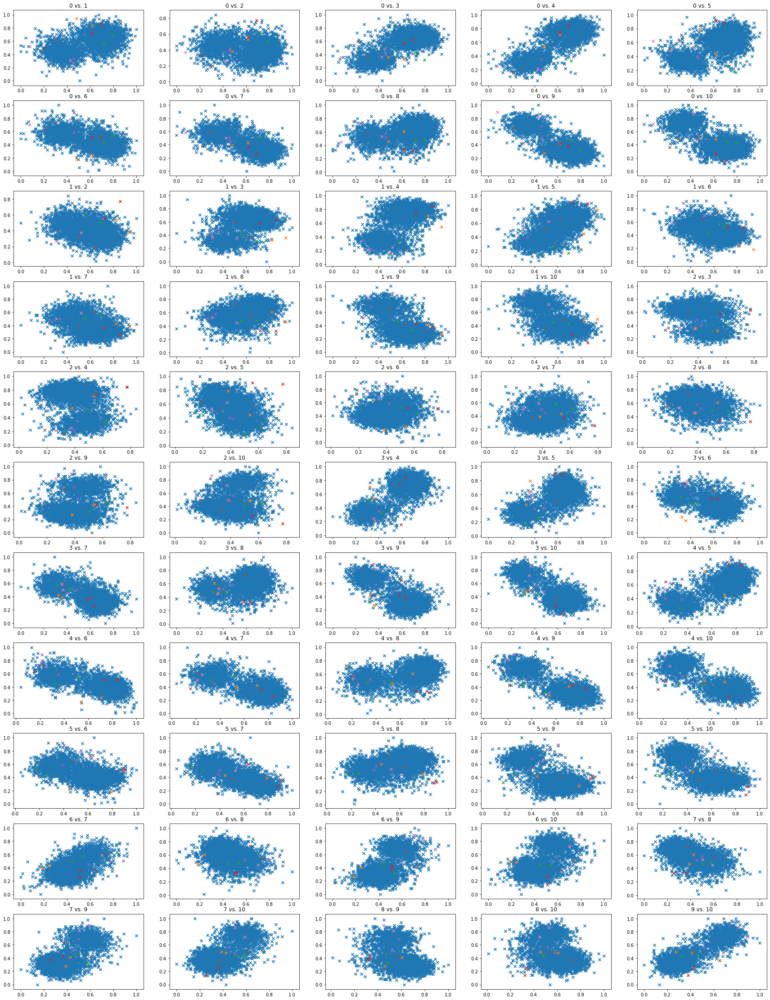

In [132]:
f, ax = plt.subplots(11,5, figsize=(30,40))
for index, i in enumerate(combinations(range(11), 2)):
    titlestr = embedding_lbls[i[0]] + " vs. " + embedding_lbls[i[1]]
    for y in range(clusters):
        rows = np.where(labels == y)[0]
        ax[index//5][index%5].scatter(bert_df.loc[rows, embedding_lbls[i[0]]], bert_df.loc[rows, embedding_lbls[i[1]]], marker="x", cmap=plt.cm.autumn)
    ax[index//5][index%5].set_title(titlestr)
    #ax[index//5][index%5].legend()

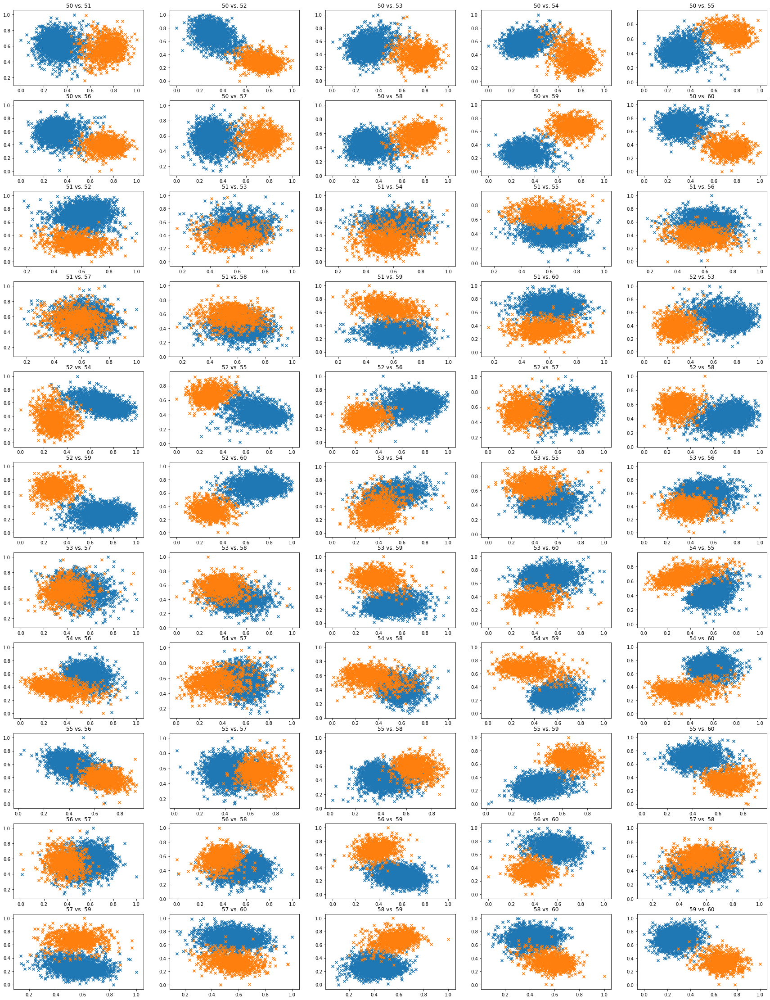

In [130]:
offset = 50
f, ax = plt.subplots(11,5, figsize=(30,40))
for index, i in enumerate(combinations(range(11), 2)):
    titlestr = embedding_lbls[i[0] + offset] + " vs. " + embedding_lbls[i[1] + offset]
    for y in range(clusters):
        rows = np.where(labels == y)[0]
        ax[index//5][index%5].scatter(bert_df.loc[rows, embedding_lbls[i[0] + offset]], bert_df.loc[rows, embedding_lbls[i[1] + offset]], marker="x", cmap=plt.cm.autumn)
    ax[index//5][index%5].set_title(titlestr)
    #ax[index//5][index%5].legend()

### Sample UMAP plot

In [ ]:
import umap
import umap.plot
from sklearn.datasets import load_digits

digits = load_digits()

mapper = umap.UMAP().fit(digits.data)
print(mapper)
print(mapper.transform(digits.data))
umap.plot.points(mapper, labels=digits.target)